In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!git clone https://github.com/pypsa-meets-africa/detect_energy.git

Cloning into 'detect_energy'...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (421/421), done.
remote: Compressing objects: 100% (236/236), done.
remote: Total 421 (delta 239), reused 354 (delta 181), pack-reused 0
Receiving objects: 100% (421/421), 8.27 MiB | 10.18 MiB/s, done.
Resolving deltas: 100% (239/239), done.


In [ ]:
!pip install geopandas rtree 

In [ ]:
import os
os.chdir('/content/drive/My Drive/PyPSA_Africa_images/')
import importlib
import sys
sys.path.append(os.getcwd()+'/detect_energy/image_download/')
import geopandas as gpd
import pandas as pd

In [ ]:
print(os.getcwd())

import vis
import main
import create_coco_format
import filter_tiles
import make_examples

/content/drive/My Drive/PyPSA_Africa_images


In [ ]:
os.getcwd()

'/content/drive/My Drive/PyPSA_Africa_images'

In [ ]:
!pwd

/content


In [ ]:
%cd ..

/


In [ ]:
%cd /content/drive/MyDrive/PyPSA_Africa_images/MAXAR_256

/content/drive/.shortcut-targets-by-id/1pMhI9rIgnuKcDAsGFtXv8j0Vxg2vNqyE/PyPSA_Africa_images/MAXAR_256


In [ ]:
dirs = ['sierra_leone', 'malawi', 'ghana']
country_dict = {'sierra_leone': 'SL', 'ghana':'GH', 'malawi': 'MW'}
base_path = os.path.join('/content', 'drive', 'My Drive', 'PyPSA_Africa_images')
out_path = os.path.join(base_path, 'MAXAR_256')

for country in dirs:
    country_code = country_dict[country]
    max_ratio = 1.
    print(f"Making Examples for {country}!")
  
    # assess satellite imagery

    data_path = os.path.join(base_path, 'maxar', country, 'raw')

    coverage_polygon = make_examples.make_polygon_list(data_path)
    towers_file = os.path.join(data_path, f"{country_code}_raw_towers.geojson")
  
    tower_df = gpd.read_file(towers_file)
    num_towers = len(tower_df)
    max_towers = int(max_ratio*num_towers)
  
    # creates the examples
    make_examples.make_examples(towers_file,
                  coverage_polygon,
                  img_path=os.path.join(out_path, f"{country_code}_"), 
                  max_length=max_towers,
                  height=256, 
                  width=256,
                  bbox_height=50,
                  bbox_width=60,
                  random_offset= True, 
                  seed=2021)
    

Making Examples for sierra_leone!
Maxiumum Number of Examples: 658
Created 10 Examples!
Created 20 Examples!
Created 30 Examples!
Created 40 Examples!
Created 50 Examples!
Created 60 Examples!
Created 70 Examples!
Created 80 Examples!
Created 90 Examples!
Created 100 Examples!
Created 110 Examples!
Created 120 Examples!
Created 130 Examples!
Created 140 Examples!
Created 150 Examples!
Created 160 Examples!
Created 170 Examples!
Created 180 Examples!
Created 190 Examples!
Created 200 Examples!
Created 210 Examples!
Created 220 Examples!
Created 230 Examples!
Created 240 Examples!
Created 250 Examples!
Created 260 Examples!
Created 270 Examples!
Created 280 Examples!
Created 290 Examples!
Created 300 Examples!
Created 310 Examples!
Created 320 Examples!
Created 330 Examples!
Created 340 Examples!
Created 350 Examples!
Created 360 Examples!
Created 370 Examples!
Created 380 Examples!
Created 390 Examples!
Created 400 Examples!
Created 410 Examples!
Created 420 Examples!
Created 430 Exampl

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
import geopandas as gpd
import numpy as np

def vis_image(examples, path, show_box=True, idx=0):
    """
    Opens image of desired index by reading the filename from examples
    Shows the image, (with bounding box if desired)
    ----------
    Arguments:
    examples : (GeoDataFrame or str)
        gdf of all examples - used to obtain filename and bbox
    path : (str)
        to directory of images and dataframe
    show_box : (bool)
        bounding box is shown if True
    idx : (int)
        desired example
    
    ----------
    Returns:
    -
    """ 

    if isinstance(examples, str): examples = gpd.read_file(path + examples)

    example = examples.iloc[idx]
    plt.figure(figsize=(10, 7))
    img = plt.imread(path + example.filename)
    fig = plt.imshow(img)

    if show_box:
        bbox = [example.ul_x, example.ul_y, example.lr_x, example.lr_y]
        rect = plt.Rectangle(xy=(bbox[0], bbox[1]), width=bbox[2] - bbox[0],
                             height=bbox[3] - bbox[1], fill=False,
                             edgecolor="r", linewidth=2)
        fig.axes.add_patch(rect)
    
    plt.show()

               filename  ...                                           geometry
318  MW_62448339520.png  ...  POLYGON ((34.06121 -11.49416, 34.06241 -11.494...
319  MW_62448339440.png  ...  POLYGON ((34.05525 -11.48721, 34.05646 -11.487...
320  MW_62448339330.png  ...  POLYGON ((34.05385 -11.48583, 34.05506 -11.485...
321  MW_62448339400.png  ...  POLYGON ((34.04477 -11.47433, 34.04598 -11.474...
322  MW_62448339280.png  ...  POLYGON ((34.06377 -11.49714, 34.06497 -11.497...

[5 rows x 6 columns]
323


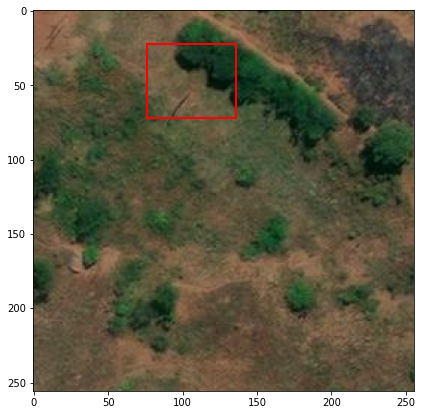

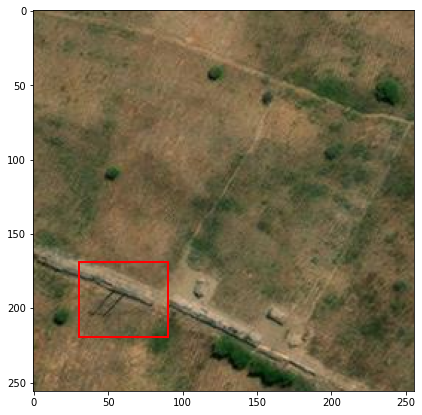

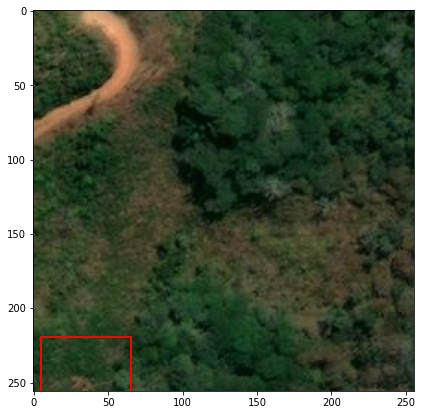

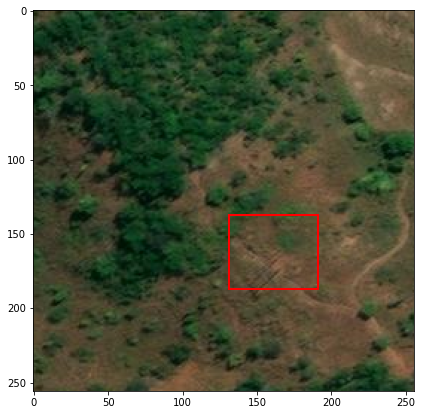

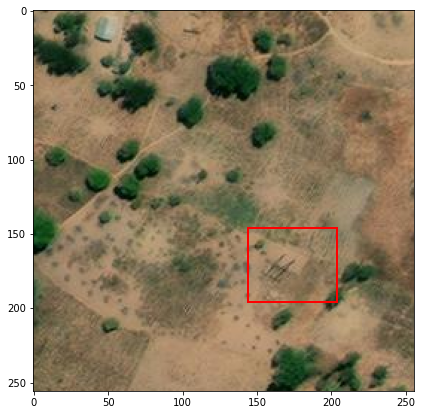

...

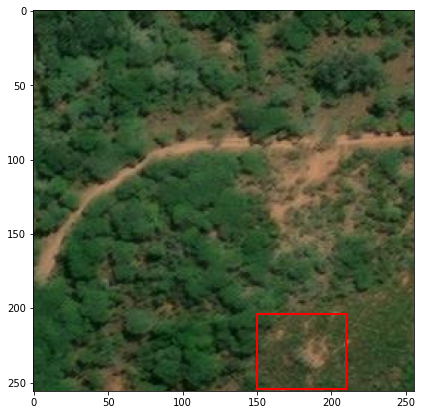

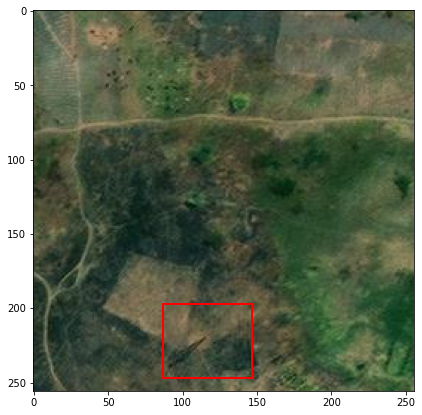

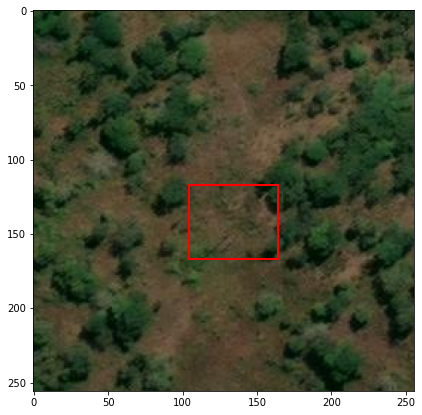

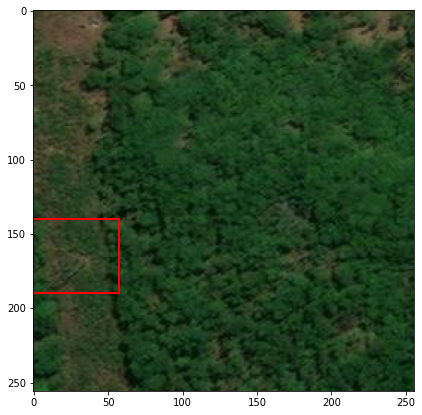

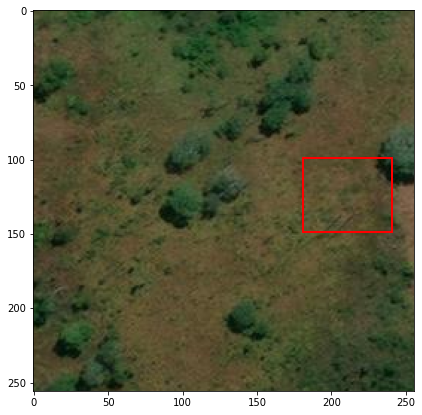

In [ ]:

country = "MW"
gjson_path = country + '_tower_examples.geojson'

path = os.path.join(base_path, 'MAXAR_256/')
examples = gpd.read_file(os.path.join(path, gjson_path))


print(examples.tail())
print(len(examples))
for _ in range(60):
    num_ex = np.random.randint(0, 300)
    path = os.path.join(base_path, 'MAXAR_256/')
    vis_image(gjson_path, path, idx=num_ex)

In [ ]:
merged_df = gpd.GeoDataFrame()
example_path = os.path.join(base_path, 'MAXAR_256')
file = os.path.join(example_path, f"{country_code}_tower_examples.geojson")

for country in dirs:
    country_code = country_dict[country]
    tower_examples_df = gpd.read_file(file)
    merged_df = pd.concat([merged_df, tower_examples_df])

merged_df = merged_df.drop_duplicates(subset='filename')
merged_df.to_file(os.path.join(example_path, "tower_examples.geojson"), driver="GeoJSON")
display(merged_df)

,filename,ul_x,ul_y,lr_x,lr_y,geometry
0,GH_62997937530.png,94.0,68.0,154.0,118.0,"POLYGON ((-2.58314 10.27751, -2.58197 10.27751..."
1,GH_62997937070.png,35.0,111.0,95.0,161.0,"POLYGON ((-2.61911 10.31246, -2.61795 10.31246..."
2,GH_62997937510.png,87.0,77.0,147.0,127.0,"POLYGON ((-2.58897 10.28316, -2.58780 10.28316..."
3,GH_30639678260.png,192.0,27.0,252.0,77.0,"POLYGON ((-2.56860 10.26331, -2.56743 10.26331..."
4,GH_62997937830.png,40.0,202.0,100.0,252.0,"POLYGON ((-2.53049 10.23013, -2.52932 10.23013..."
...,...,...,...,...,...,...
2910,GH_63063757140.png,108.0,20.0,168.0,70.0,"POLYGON ((-2.04339 8.12995, -2.04225 8.12995, ..."
2911,GH_30639690180.png,-8.0,123.0,52.0,173.0,"POLYGON ((-2.04849 8.02889, -2.04735 8.02889, ..."
2912,GH_30639691170.png,189.0,15.0,249.0,65.0,"POLYGON ((-2.10690 8.23351, -2.10576 8.23351, ..."
2914,GH_30639690700.png,186.0,21.0,246.0,71.0,"POLYGON ((-2.05561 8.19207, -2.05447 8.19207, ..."


In [ ]:
df = gpd.read_file(os.path.join(os.getcwd(), 'MAXAR_256', 'tower_examples.geojson'))
files = os.listdir(os.getcwd() + '/MAXAR_256')

df['exists'] = df['filename'].apply(lambda entry: entry in files)

print(df['exists'].sum())

    

8748


In [ ]:
file = os.path.join(base_path, 'MAXAR_256', 'tower_examples.geojson')
filter_tiles.filter_images(file, delete_filtered=True, black_point=50, 
                           dark_threshold=.5, white_point=150, cloudy_threshold=.45, 
                           blurry_threshold=.65)

Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937530.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937070.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937510.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937390.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_30639679750.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_30639680000.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937060.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937330.png
Blurry Image Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_62997937360.png
Black Border Detected! for /content/drive/My Drive/PyPSA_Africa_images/MAXAR_256/GH_30639680080.png


,filename,ul_x,ul_y,lr_x,lr_y,geometry
3,GH_30639678260.png,192.0,27.0,252.0,77.0,"POLYGON ((-2.56860 10.26331, -2.56743 10.26331..."
4,GH_62997937830.png,40.0,202.0,100.0,252.0,"POLYGON ((-2.53049 10.23013, -2.52932 10.23013..."
7,GH_62997965950.png,118.0,181.0,178.0,231.0,"POLYGON ((-2.50490 10.20754, -2.50373 10.20754..."
11,GH_30639678250.png,88.0,208.0,148.0,258.0,"POLYGON ((-2.56673 10.26280, -2.56556 10.26280..."
12,GH_62997937670.png,102.0,212.0,162.0,262.0,"POLYGON ((-2.53521 10.23402, -2.53404 10.23402..."
...,...,...,...,...,...,...
1321,GH_30639690570.png,97.0,30.0,157.0,80.0,"POLYGON ((-2.03781 8.15512, -2.03667 8.15512, ..."
1322,GH_30639690750.png,126.0,-14.0,186.0,36.0,"POLYGON ((-2.06652 8.20466, -2.06538 8.20466, ..."
1323,GH_30639690590.png,100.0,71.0,160.0,121.0,"POLYGON ((-2.03754 8.16108, -2.03640 8.16108, ..."
1325,GH_30639690180.png,-8.0,123.0,52.0,173.0,"POLYGON ((-2.04849 8.02889, -2.04735 8.02889, ..."


In [ ]:
filter_tiles.verify_df_img('tower_examples_clean.geojson')

Length Test Failed
Number of images in /content/drive/.shortcut-targets-by-id/1pMhI9rIgnuKcDAsGFtXv8j0Vxg2vNqyE/PyPSA_Africa_images/maxar_test: 1783
Number of filenames in tower_examples_clean.geojson: 499
Image Existance Test Failed
Images Not in tower_examples_clean.geojson : {'GH_62999148020.png', 'GH_62996361620.png', 'GH_62997937060.png', 'SL_76573988930.png', 'GH_30639700990.png', 'SL_76574010940.png', 'SL_35649766950.png', 'GH_30639690840.png', 'GH_62999148050.png', 'SL_86684088780.png', 'GH_62997937330.png', 'GH_30639690830.png', 'GH_63063672300.png', 'GH_30639701340.png', 'GH_25355053250.png', 'GH_30639690610.png', 'GH_86299029410.png', 'SL_21790805120.png', 'SL_78655588000.png', 'GH_62997937820.png', 'GH_62997937250.png', 'GH_30639701180.png', 'GH_62999148010.png', 'GH_30639690120.png', 'SL_86684088870.png', 'GH_86299029200.png', 'GH_30639680000.png', 'GH_30639701990.png', 'GH_30639694380.png', 'GH_30639693320.png', 'GH_30639701650.png', 'GH_26212613000.png', 'GH_26227028260.

False

## Train-Test Splits

In [ ]:
def split_data(gdf_path, train_ratio=0.8, seed=202):
    df = gpd.read_file(gdf_path)
    df_dir = os.path.dirname(os.path.abspath(gdf_path)) +'/'
    train = df.sample(frac=train_ratio, random_state=seed) #random state is a seed value
    
    val = df.drop(train.index)
    val = val.sample(frac=1, random_state=seed)
    train.to_file(df_dir + "tower_examples_train.geojson", driver="GeoJSON")
    val.to_file(df_dir + "tower_examples_val.geojson", driver="GeoJSON")

    return train, val

train,val = split_data(os.path.join(base_path, 'MAXAR_256', "tower_examples_clean.geojson"), 
                                    train_ratio=0.8, seed=202)
display(train)
display(val)

,filename,ul_x,ul_y,lr_x,lr_y,geometry
122,GH_62997966390.png,18.0,-14.0,78.0,36.0,"POLYGON ((-2.46598 10.09213, -2.46511 10.09213..."
5,GH_30639677960.png,132.0,177.0,192.0,227.0,"POLYGON ((-2.53728 10.18508, -2.53611 10.18508..."
888,GH_62999148140.png,118.0,99.0,178.0,149.0,"POLYGON ((-2.02765 8.16330, -2.02651 8.16330, ..."
78,GH_62997966370.png,53.0,143.0,113.0,193.0,"POLYGON ((-2.46316 10.09762, -2.46229 10.09762..."
500,GH_77242258610.png,179.0,213.0,239.0,263.0,"POLYGON ((-1.49019 8.81032, -1.48917 8.81032, ..."
...,...,...,...,...,...,...
217,GH_30639702200.png,55.0,130.0,115.0,180.0,"POLYGON ((-2.45557 9.91285, -2.45471 9.91285, ..."
681,GH_30639691530.png,148.0,59.0,208.0,109.0,"POLYGON ((-2.15850 8.23539, -2.15730 8.23539, ..."
98,GH_62997966170.png,172.0,85.0,232.0,135.0,"POLYGON ((-2.46091 10.16892, -2.46004 10.16892..."
481,GH_77242258340.png,40.0,22.0,100.0,72.0,"POLYGON ((-1.49423 8.71719, -1.49321 8.71719, ..."


,filename,ul_x,ul_y,lr_x,lr_y,geometry
808,GH_30639690850.png,157.0,26.0,217.0,76.0,"POLYGON ((-2.06999 8.21783, -2.06885 8.21783, ..."
838,GH_63063672320.png,205.0,221.0,265.0,271.0,"POLYGON ((-2.07221 8.21105, -2.07107 8.21105, ..."
488,GH_26227028370.png,157.0,218.0,217.0,268.0,"POLYGON ((-1.46110 8.74457, -1.46008 8.74457, ..."
497,GH_77242258370.png,152.0,64.0,212.0,114.0,"POLYGON ((-1.49141 8.72744, -1.49039 8.72744, ..."
335,GH_30639700370.png,7.0,84.0,67.0,134.0,"POLYGON ((-2.45021 9.61220, -2.44935 9.61220, ..."
...,...,...,...,...,...,...
841,GH_30639691210.png,82.0,202.0,142.0,252.0,"POLYGON ((-2.11360 8.23448, -2.11246 8.23448, ..."
186,GH_63000817680.png,0.0,6.0,60.0,56.0,"POLYGON ((-1.39097 8.92072, -1.39019 8.92072, ..."
342,GH_30639698560.png,94.0,-13.0,154.0,37.0,"POLYGON ((-2.43305 9.46548, -2.43220 9.46548, ..."
748,GH_30639701300.png,84.0,27.0,144.0,77.0,"POLYGON ((-2.49242 9.77250, -2.49147 9.77250, ..."


## Create COCO

In [ ]:
train_file = os.path.join(base_path, 'MAXAR_256', 'tower_examples_train.geojson')
val_file = os.path.join(base_path, 'MAXAR_256', 'tower_examples_val.geojson')

create_coco_format.to_coco(train_file, '_train', height=256, width=256)
create_coco_format.to_coco(val_file, '_val', height=256, width=256)

In [ ]:
!pip install fiftyone

In [ ]:
import fiftyone as fo

In [ ]:
# The directory containing the source images
data_path = "/content/drive/MyDrive/PyPSA_Africa_images/MAXAR_256/"
# The path to the COCO labels JSON file
labels_path = "/content/drive/MyDrive/PyPSA_Africa_images/MAXAR_256/tower_coco_val.json"

In [ ]:
# Import the dataset
import os

os.chdir('/content/drive/MyDrive/PyPSA_Africa_images/MAXAR_256/')

# The directory containing the source images
mode = 'train'
data_path = "/content/drive/MyDrive/PyPSA_Africa_images/datasets/maxar_"+mode
# The path to the COCO labels JSON file
labels_path = data_path + '/labels.json'

dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=data_path,
    labels_path=labels_path,
)

 100% |█████████████████| 762/762 [1.5s elapsed, 0s remaining, 520.4 samples/s]         


In [ ]:
session = fo.launch_app(dataset)

In [ ]:
import os
os.path.join('test', 'file.txt')

'test/file.txt'

## transfer to dataset directory

In [ ]:
from shutil import copyfile

settypes = ['train', 'val']

for settype in settypes:
    origin = os.path.join(base_path, "MAXAR_256")
    destpath = os.path.join(base_path, 'datasets', 'maxar_'+settype)

    print(os.listdir(destpath))
    for file in [os.path.join(destpath, f) for f in os.listdir(destpath)]:
        os.remove(file)

    gdf =  os.path.join(origin, 'tower_examples_'+settype+'.geojson')
    gdf = gpd.read_file(gdf)

    for i, row in gdf.iterrows():

        file = row['filename']
        copyfile(os.path.join(origin, file), os.path.join(destpath, file))

    copyfile(os.path.join(origin, 'tower_coco_'+settype+'.json'), 
             os.path.join(destpath, 'labels.json'))







[]
[]
